# PROJECT NOTEBOOK: PEDESTRIAN DETECTION FOR AUTONOMOUS CARS
S/N	Names	Registration No.
	Access No.

1	Obete Felix	S24M25/014	B31209

2	Nantume Robinah	S25M24/015	B31210

3	Ester Asasira	S24M25/006	B30928

4	Kenneth Maloba	S24M25/002	B30924

5	Emmanuel Olato	S24M25/005	B30927

6.Romeo Akiki	S23M25/005	B24959

7.Mathias Waigulo	S24M25/013	B31199


In [1]:
#@title Installing dependency and importing yolo module
# installing ultralytics into the collab environemt. the yolo version used in this is from ultralytics
!pip install ultralytics --quiet
from ultralytics import YOLO

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 27.8 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
#@title Loading the pretrained YOLOv5 model
model = YOLO('yolov5nu.pt')

In [2]:
#@title Mounting the project storage on myDrive
import os
from google.colab import drive
drive.mount('/content/drive')
DRIVE_ROOT = '/content/drive/MyDrive/Projects/OD_Project/'

Mounted at /content/drive


# Data Processing
The data was downloaded form kitti website and processsed remotely. A ready to use data arranged in the right folder structure was upldaedfor use in this note book. the following processes were carried out

1.   Lines in  the Label files without the pedestrian annotation was deleted leaving only those with pedestrian and sitting persons
2.   Convert the labels into YOLO compatible formats whivh saves a.ymal for data access
 see the corresponding python scripts attached




# Training Parameters


*   Explicit Parameters set up during training.

Epochs: 100 (total number of training epochs). Test done at epoch 40 for this report, Image Size (imgsz): 512 (images resized to 512x512 pixels). Batch Size (batch): 16 (number of images per batch). Workers (workers): 2 (number of data loader workers for parallel data loading). Device: 0 (uses GPU with CUDA device 0, collab`s Tesla T4). Exist OK (exist_ok): True (allows overwriting existing run directory). Save: True (saves model checkpoints).Verbose: True (enables detailed logging). Patience: 20 (early stopping after 20 epochs without improvement).

*   Pretrained Model Parameters:

Pretrained weights (yolov5nu.pt), with 391/427 items transferred. The pretrained model includes settings like the number of classes (nc=80, overridden to nc=2 for the pedestrian dataset) and architectural details (e.g., YOLOv5n with 2,508,854 parameters), Loss weights (box=7.5, cls=0.5, dfl=1.5),Freezing strategies (Freezing layer 'model.24.dfl.conv.weight')

*   Finally Ultralytics Default Parameters






In [ ]:
#@title Training (fine tuning) on KITTI Dataset
model.train(
    data=f'/{DRIVE_ROOT}/dataset/pedestrian.yaml',
    epochs=100,
    imgsz=512,
    batch=16,
    workers=2,
    device=0,
    project=f'/{DRIVE_ROOT}/yolo_runs',
    name='yolo_kitti_pedestrian_fast',
    exist_ok=True,
    save=True,
    verbose=True,
    patience=20
  )

Ultralytics 8.3.217 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=//content/drive/MyDrive/Projects/OD_Project//dataset/pedestrian.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov5nu.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_kitti_pedestrian_fast, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_m

In [ ]:
#@title Resuming Training incase Training is disrupted
model = YOLO(f'{DRIVE_ROOT}/yolo_runs/yolo_kitti_pedestrian_fast/weights/last.pt')

model.train(
    data=f'{DRIVE_ROOT}/dataset/pedestrian.yaml',
    epochs=100,
    imgsz=512,
    batch=16,
    workers=2,
    device="cpu",
    project=f'/{DRIVE_ROOT}/yolo_runs',
    name='yolo_kitti_pedestrian_fast',
    exist_ok=True,
    save=True,
    verbose=True,
    patience=20,
    resume=True
)

Ultralytics 8.3.217 🚀 Python-3.12.12 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=//content/drive/MyDrive/Projects/OD_Project//dataset/pedestrian.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/Projects/OD_Project/yolo_runs/yolo_kitti_pedestrian_fast/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_kitti_

# Learning Results

During models learning, a number of metrices is recorded for each epoch icluing mAP, Class loss, Boundingbox loss,precision, recall among others. A polt of the above against the epoch give a view of how the training progress

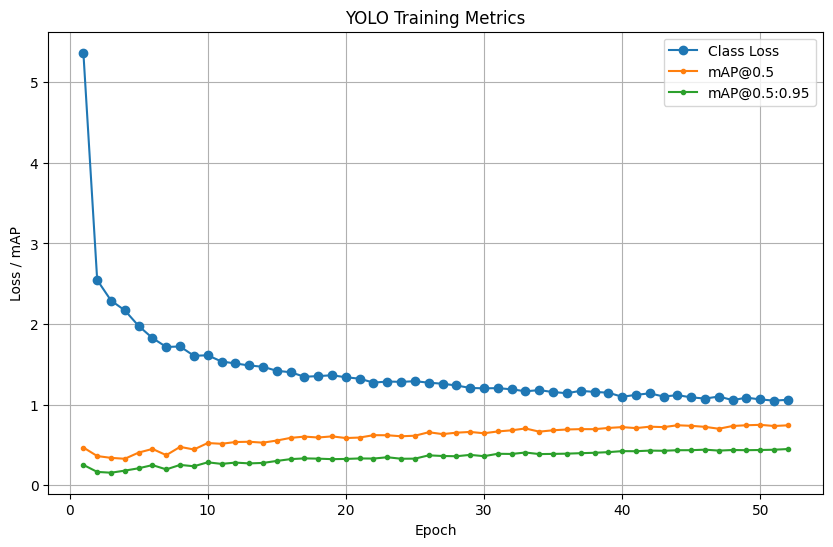

In [3]:
#@title A plot of the learning results
import pandas as pd
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output

# Path to your YOLO training results CSV (saved on Google Drive)
metrics_csv = f'/{DRIVE_ROOT}/yolo_runs/yolo_kitti_pedestrian_fast/results.csv'

plt.ion()  # interactive mode
fig, ax = plt.subplots(figsize=(10,6))
df = pd.read_csv(metrics_csv)
ax.plot(df['epoch'], df['train/cls_loss'], label='Class Loss', marker='o')
ax.plot(df['epoch'], df['metrics/mAP50(B)'] , label='mAP@0.5', marker='.')
ax.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP@0.5:0.95', marker='.')

ax.set_xlabel('Epoch')
ax.set_ylabel('Loss / mAP')
ax.set_title('YOLO Training Metrics')
ax.legend()
ax.grid(True)
plt.show()


# Model Evalution Matrics
Box Loss: Measures bounding box localization error (training).
1.   Class Loss: Measures object classification error (training).
2.   DFL Loss: Measures precision in bounding box predictions (training).
3.   Precision (P): Ratio of correct positive detections (validation).
4.   Recall (R): Ratio of detected actual positives (validation).
5.   mAP@0.5: Mean Average Precision at IoU=0.5 (validation).
6.   mAP@0.5:0.95: Mean Average Precision across IoU=0.5 to 0.95 (validation).







.




In [4]:
#using the best saved model
model = YOLO(f'{DRIVE_ROOT}/yolo_runs/yolo_kitti_pedestrian_fast/weights/best.pt')

In [5]:
#@title Validating the model
metrics = model.val(save=True)
print(metrics)


Ultralytics 8.3.217 🚀 Python-3.12.12 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
YOLOv5n summary (fused): 84 layers, 2,503,334 parameters, 0 gradients, 7.1 GFLOPs
val: Fast image access ✅ (ping: 1.2±0.6 ms, read: 2.3±0.5 MB/s, size: 821.8 KB)
val: Scanning /content/drive/MyDrive/Projects/OD_Project/dataset/labels/val.cache... 481 images, 374 backgrounds, 7 corrupt: 100% ━━━━━━━━━━━━ 481/481 425.4Kit/s 0.0s
val: /content/drive/MyDrive/Projects/OD_Project/dataset/images/val/007109.png: ignoring corrupt image/label: Label class 1 exceeds dataset class count 1. Possible class labels are 0-0
val: /content/drive/MyDrive/Projects/OD_Project/dataset/images/val/007136.png: ignoring corrupt image/label: Label class 1 exceeds dataset class count 1. Possible class labels are 0-0
val: /content/drive/MyDrive/Projects/OD_Project/dataset/images/val/007201.png: ignoring corrupt image/label: Label class 1 exceeds dataset class count 1. Possible class labels are 0-0
val: /content/drive/MyDrive/Proje

# Testing on Real world Data

In this section, we test the best model on images and videas from shutterstock. public and freely available.

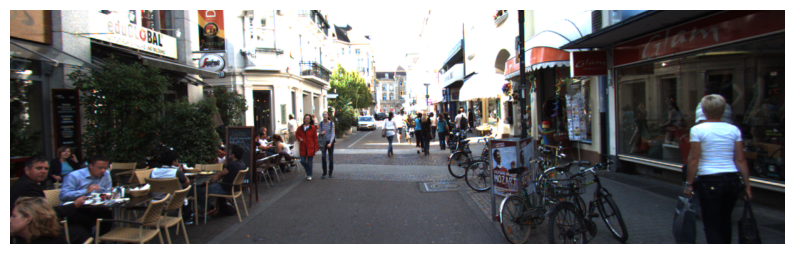

In [6]:
#@title Title on test image

#Displaying Test image
from PIL import Image
import matplotlib.pyplot as plt


# Full absolute path
image_path = f'{DRIVE_ROOT}/dataset/images/val/007109.png'

original = Image.open(image_path)


# Original image
plt.figure(figsize=(10, 10))
plt.imshow(original)
plt.axis("off")
plt.show()

plt.show()



image 1/1 /content/drive/MyDrive/Projects/OD_Project/dataset/images/val/007109.png: 160x512 10 pedestrians, 58.0ms
Speed: 1.9ms preprocess, 58.0ms inference, 7.1ms postprocess per image at shape (1, 3, 160, 512)


<function matplotlib.pyplot.show(close=None, block=None)>

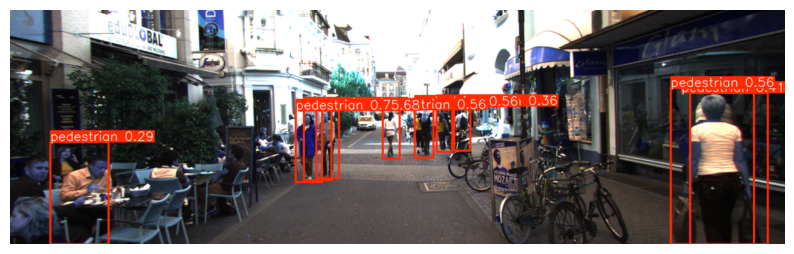

In [7]:
#@title Detecting Pedestrians in the test image
results = model.predict(f'{DRIVE_ROOT}/dataset/images/val/007109.png', conf=0.25)

result = results[0]
#result.save(filename="\output\detected.png")
# Get annotated image (as NumPy array)
annotated_img = result.plot()

# Display inline in VS Code Notebook
plt.figure(figsize=(10, 10))
plt.imshow(annotated_img)
plt.axis("off")
plt.show


In [8]:
from IPython.display import HTML
from base64 import b64encode

video_path = f'{DRIVE_ROOT}/dataset/downtown.mp4'

mp4 = open(video_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=640 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")

In [9]:
#@title Detecting Pedestian Videos
#Loading best model
model = YOLO(f'{DRIVE_ROOT}/yolo_runs/yolo_kitti_pedestrian_fast/weights/best.pt')

# Run prediction and save annotated output
results = model.predict(
    source=f'{DRIVE_ROOT}/dataset/downtown.mp4',
    conf=0.25,
    save=True,
    project=f'{DRIVE_ROOT}/yolo_runs',
    name='pedestrian_video_test',
    exist_ok=True
)

!ffmpeg -i "{DRIVE_ROOT}/yolo_runs/pedestrian_video_test/downtown.avi" \
  -vcodec libx264 -acodec aac "{DRIVE_ROOT}/yolo_runs/pedestrian_video_test/downtown.mp4"




WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/717) /content/drive/MyDrive/Projects/OD_Project/dataset/downtown.mp4: 320x512 3 pedestrians, 162.0ms
video 1/1 (frame 2/717) /content/drive/MyDrive/Projects/OD_Project/dataset/downtown.mp4: 320x512 4 pedestrians, 155.3ms
video 1/1 (frame 3/717) /content/drive/MyDrive/Projects/OD_Project/dataset/downtown.mp4: 320x512 3 pedestrians, 147.9ms
video 1/1 (frame 4/717) /content/drive/MyDrive/Projects/OD_Project/dataset/downtown.mp4: 320x512

In [11]:
# The output video is saved in the specified project and name subfolder
output_video = f'{DRIVE_ROOT}/yolo_runs/pedestrian_video_test/downtown.mp4'

mp4 = open(output_video, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=640 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")

# Comparison with Traditional Object detection

YOLO is a more recent object Detection method based on DeepLearning. however, before that there was HOG(Histogram of Oriented Gradients
HOG is a feature descriptor used in object detection that captures an object's shape and structure by analyzing the distribution of edge orientations within an image.
Below is an implementation of HOG Descriptor on the same image to compare its performance

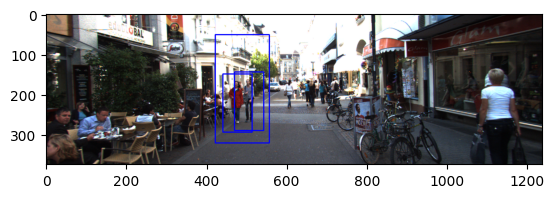

In [14]:
import cv2
import matplotlib.pyplot as plt

# Initializing HOG descriptor/person detector
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# Reading image
img = cv2.imread(f'{DRIVE_ROOT}/dataset/images/val/007109.png')

# Detecting pedestrians
(rects, weights) = hog.detectMultiScale(img, winStride=(8,8), padding=(8,8), scale=1.05)

# Drawing rectangles
for (x, y, w, h) in rects:
    cv2.rectangle(img, (x, y), (x + w, y + h), (255,0,0), 2)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()